2️⃣ 핵심 개념 (딱 1줄)

👉 이전 상태(h)를 다음 계산에 계속 사용한다

3️⃣ 가장 간단한 구조

RNN 하나의 셀은 이렇게 동작함:

h_t = f(Wx * x_t + Wh * h_{t-1})
x_t : 현재 입력
h_{t-1} : 이전 기억
h_t : 현재 기억

👉 즉, 현재 입력 + 이전 기억 = 새로운 기억

4️⃣ 진짜 초간단 예제
🎯 목표

숫자 증가 패턴 학습

입력: 1 → 2 → 3
출력: 2 → 3 → 4

👉 “+1 규칙” 배우기



| 모델          | 특징             | 사용 분야               |
| ----------- | -------------- | ------------------- |
| ANN         | 순서 정보 없음       | 분류, 회귀              |
| CNN         | 이미지 공간 정보      | 이미지 처리              |
| SimpleRNN   | 짧은 시퀀스 처리      | 기초 시계열              |
| LSTM        | 장기 의존성 해결      | 번역, 음성, 시계열         |
| GRU         | LSTM보다 가볍고 빠름  | 실시간 예측, NLP         |
| Transformer | 병렬 처리, 긴 문맥 학습 | LLM, 번역, 챗봇, 생성형 AI |


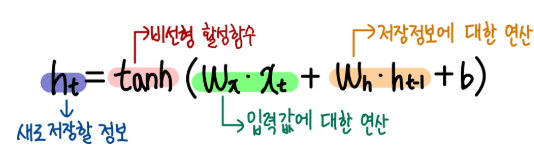
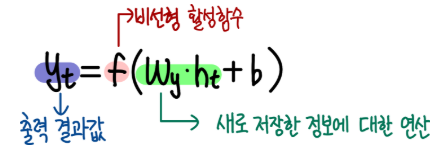

```
model = Sequential()
model.add(SimpleRNN(4, input_shape=(3, 2)))
```
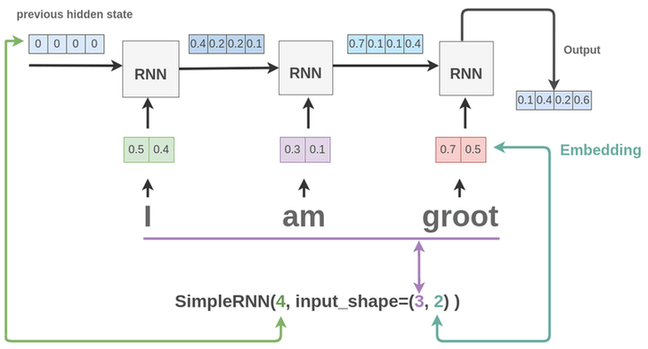

In [3]:
import numpy as np

# 데이터
x = np.array([1, 2, 3])
y = np.array([2, 3, 4])

# 초기 가중치
# Wx = np.random.randn()
# Wh = np.random.randn()
# b = np.random.randn()

Wx = 0.5   # 입력 가중치
Wh = 0.8   # 이전 상태 가중치
b  = 0.0   # 편향


# 초기 hidden state
h = 0

# 순전파 (forward)
outputs = []

for t in range(len(x)):
    h = np.tanh(Wx * x[t] + Wh * h + b)
    print(f"t={t+1}, h={h:.3f}")
    outputs.append(h)

# h1 = tanh(0.5*1 + 0.8*0)
#     = tanh(0.5)
#     ≈ 0.462

# h2 = tanh(0.5*2 + 0.8*0.462)
#     = tanh(1 + 0.3696)
#     = tanh(1.3696)
#     ≈ 0.878

# h3 = tanh(0.5*3 + 0.8*0.878)
#     = tanh(1.5 + 0.7024)
#     = tanh(2.2024)
#     ≈ 0.976

# 4️⃣ 결과
# h1 ≈ 0.462
# h2 ≈ 0.878
# h3 ≈ 0.976

# 5️⃣ 핵심 깨달음 🔥

# 이걸 보면 중요한 포인트가 보인다:

# 👉 단순히 1,2,3 넣은 게 아니라

# h2 = (현재 입력 2) + (이전 기억 h1)
# h3 = (현재 입력 3) + (이전 기억 h2)


print("RNN 출력:", outputs)

t=1, h=0.462
t=2, h=0.879
t=3, h=0.976
RNN 출력: [np.float64(0.46211715726000974), np.float64(0.8786223746838898), np.float64(0.9758816208890569)]


In [ ]:
https://yjjo.tistory.com/32

https://firstmove.tistory.com/32

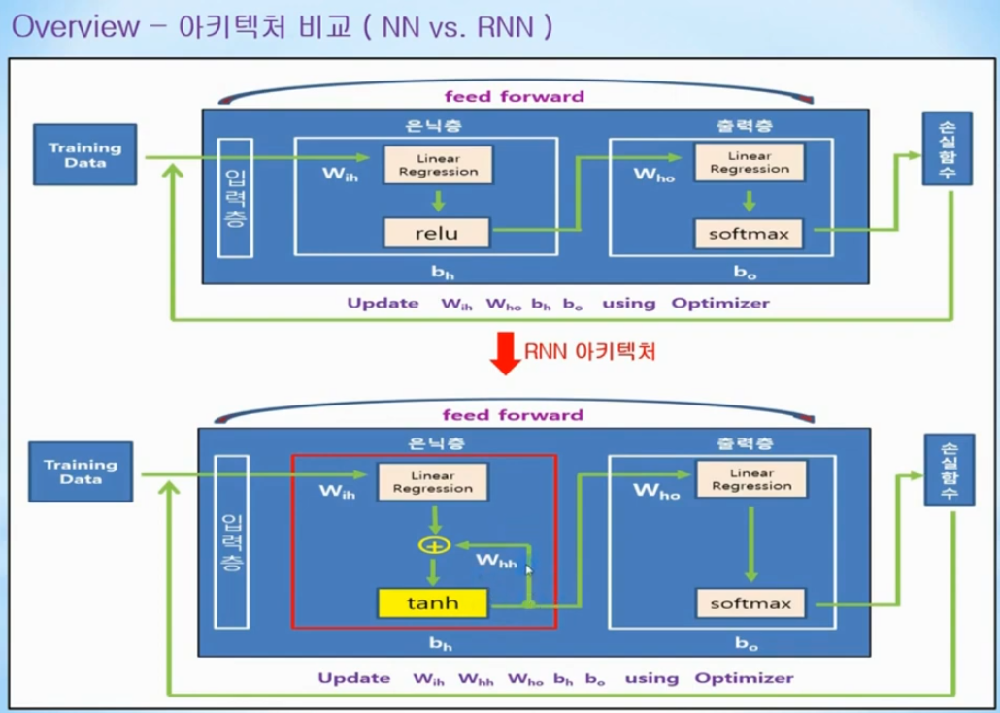

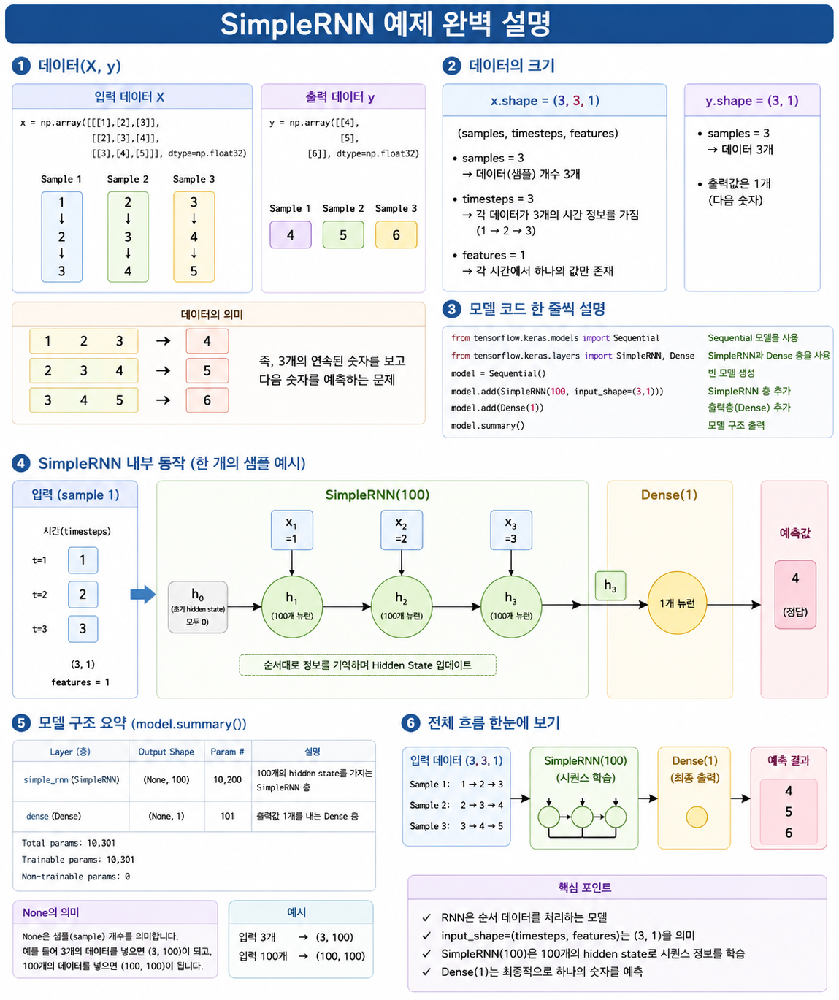

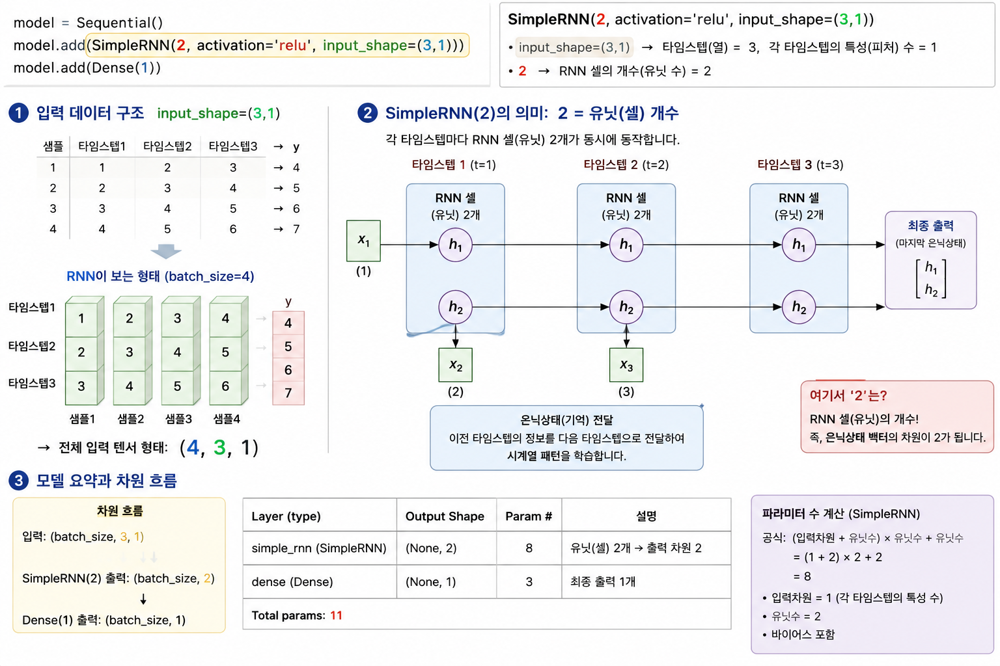

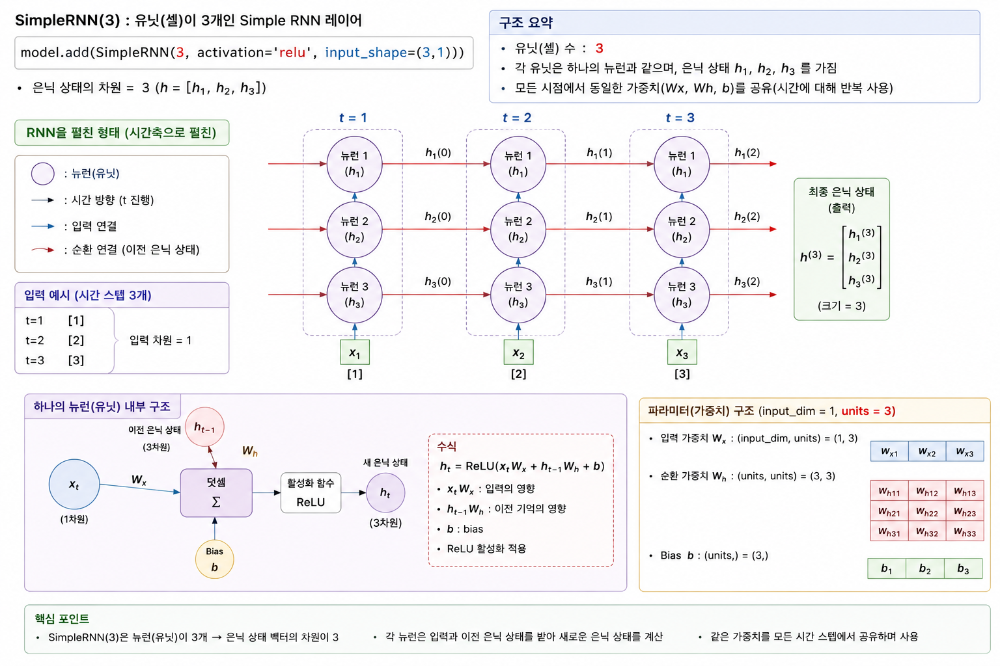

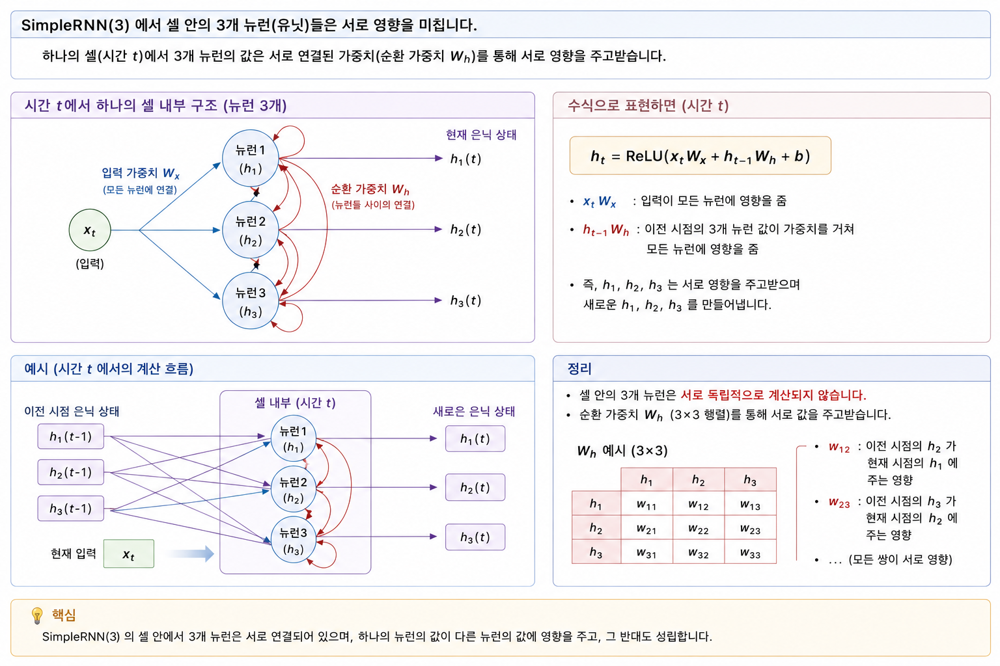

In [ ]:
# https://ebbnflow.tistory.com/135

In [1]:
import numpy as np
## x & y
x = np.array([[[1],[2],[3]],[[2],[3],[4]],[[3],[4],[5]]], dtype=np.float32)
y = np.array([[4],[5],[6]], dtype=np.float32)

x.shape, y.shape

((3, 3, 1), (3, 1))

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN,Dense

# 예를 들어 (1, 2, 8)이라면 "1개의 데이터가 2개의 시점(예: 작년, 올해)을 가지고 있고, 
# 각 시점마다 8개의 특징(Hidden State)이 있다"는 뜻.

# 데이터를 reshape을 통해 3차원으로 만들어주는 이유는
# LSTM의 입력으로는 3차원의 데이터가 필요하기 때문입니다. (data size, time_steps, features)
# 출처: https://ebbnflow.tistory.com/135 [삶은 확률의 구름:티스토리]

model = Sequential()
model.add(SimpleRNN(100, input_shape=(3,1)))
# model.add(SimpleRNN(3, input_length=2, input_dim=10))와 동일함.
# model.add(Dense(5))
model.add(Dense(1))
model.summary()

model.compile(loss="mse",optimizer="adam")  

model.fit(x,y,epochs=1000,verbose=0)

print('[Result for Training Data]')
print(model.predict(x))
print('')
print('[Result for Test Data]')
print(model.predict(np.array([[[4],[5],[6]]], dtype=np.float32)))

SyntaxError: invalid syntax (2035554182.py, line 4)